In [1]:
%matplotlib inline

In [2]:
import os
from pathlib import Path

import cortex
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt 


In [3]:
print("cortex", cortex.__version__)
print("nibabel", nib.__version__)
print("numpy", np.__version__)
import matplotlib
print('matplotlib version: ', matplotlib.__version__)

cortex 1.2.5
nibabel 3.0.0
numpy 1.23.4
matplotlib version:  3.7.5


# Noise Ceilings Projected onto Individual Flat Maps

This notebook includes code to visualize the voxelwise noice ceilings onto subject-specific cortical flat maps as seen in:
* **Fig 2A, Quality Metrics**.

**To run the cells**, you will need to:

1. Pull files from the following two submodules: 
* ***cneuromod-things/anatomical/smriprep/sourcedata/freesurfer***
* ***cneuromod-things/anatomical/pycortex***

2. Pull the following input files: 
* ***cneuromod-things/THINGS/glmsingle/sub-{s}/glmsingle/output/sub-{s}_task-things_space-T1w_model-fitHrfGLMdenoiseRR_stats-noiseCeilings_statmap.nii.gz***

3. Install pycortex:
* To do so, follow the instructions from the **cneuromod-things/anatomical/pycortex** submodule's README.md file. 



In [4]:
# set Freesufer variable SUBJECTS_DIR to "path/to/cneuromod-things/anatomical/smriprep/sourcedata/freesurfer"

fs_path = f'{Path("../../anatomical/smriprep/sourcedata/freesurfer").resolve()}'

os.environ['SUBJECTS_DIR'] = fs_path

!echo $SUBJECTS_DIR        

/home/labopb/Documents/Marie/neuromod/cneuromod-things/anatomical/smriprep/sourcedata/freesurfer


In [5]:
# Set paths 

ns_path = Path("../../THINGS/glmsingle").resolve()
fig_save_path = Path("../figures").resolve()


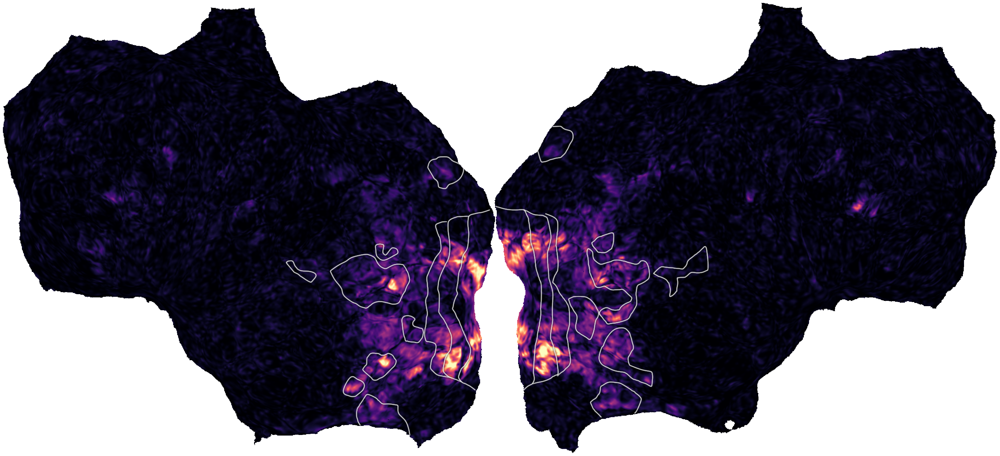

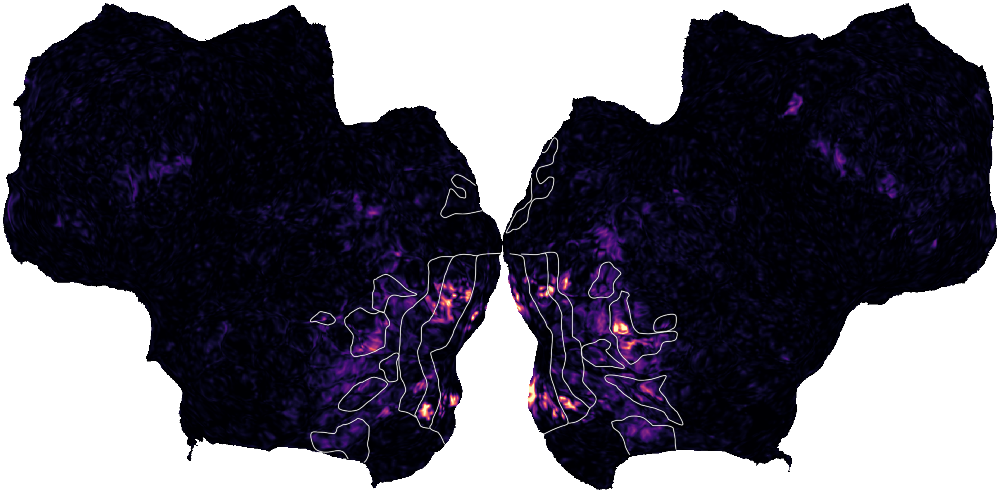

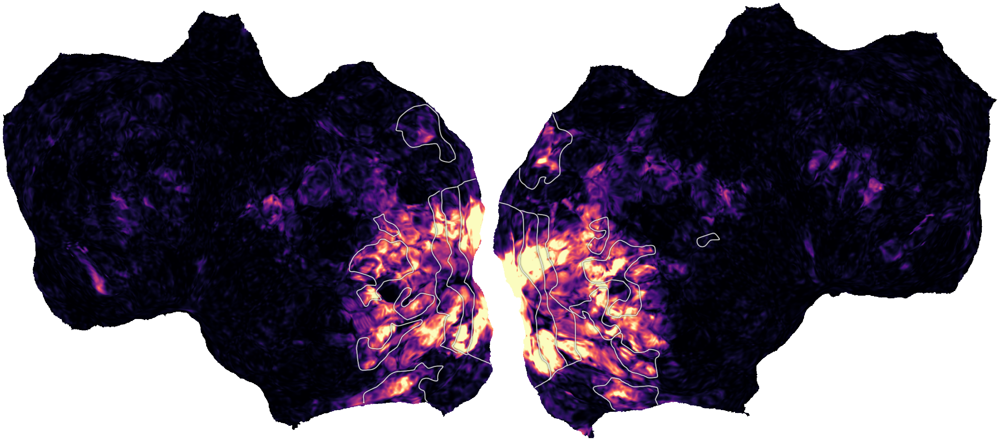

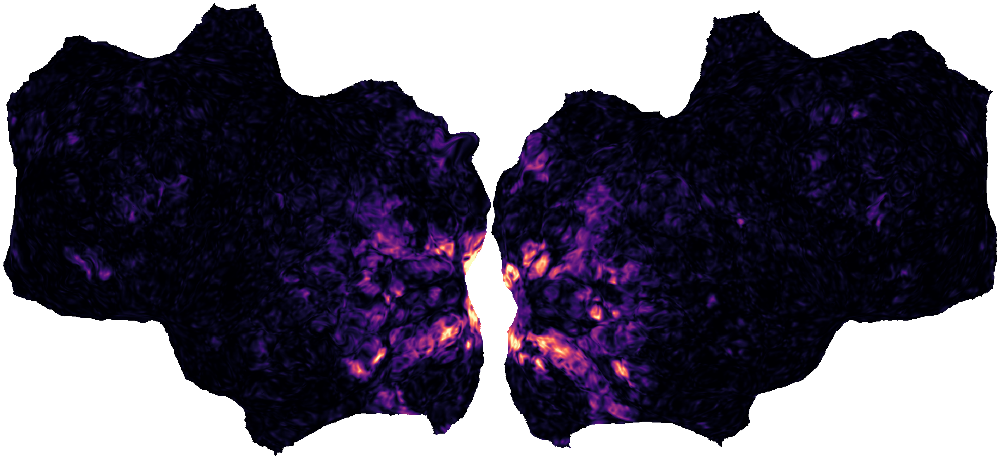

In [6]:
"""
Produce figures 

Examples of use: https://python.hotexamples.com/examples/cortex/-/quickshow/python-quickshow-function-examples.html
LIMITATION: cannot set up opacity like with the Pycortex graphic interface
"""

# set to True to export .png file
save_fig = False

nc_thresh = 0.0

for s in ["01", "02", "03", "06"]:
    
    ns = f"{ns_path}/sub-{s}/glmsingle/output/sub-{s}_task-things_space-T1w_model-fitHrfGLMdenoiseRR_stats-noiseCeilings_statmap.nii.gz"
    ns_arr = np.swapaxes(nib.load(ns).get_fdata(), 0, -1)

    ns_arr[ns_arr < nc_thresh] = np.nan
    my_vol = cortex.Volume(
        ns_arr,
        f'sub-{s}',
        'align_auto',
        vmin=0,
        vmax=35,
        cmap='magma',
    )
    
    fig = plt.figure(figsize=(17*2,10*2))
    cortex.quickshow(
        my_vol,
        pixelwise=True,
        with_colorbar=False,
        nanmean=True,
        with_curvature=True,
        sampler='trilinear',
        with_labels=False,
        with_rois=True,
        curv_brightness=1.0,
        dpi=300, 
        fig=fig,
    )
    
    if save_fig:
        fig.savefig(f'{fig_save_path}/sub-{s}_noiseCeil_flatmap.png', dpi=300)
    

<Figure size 3400x2000 with 0 Axes>

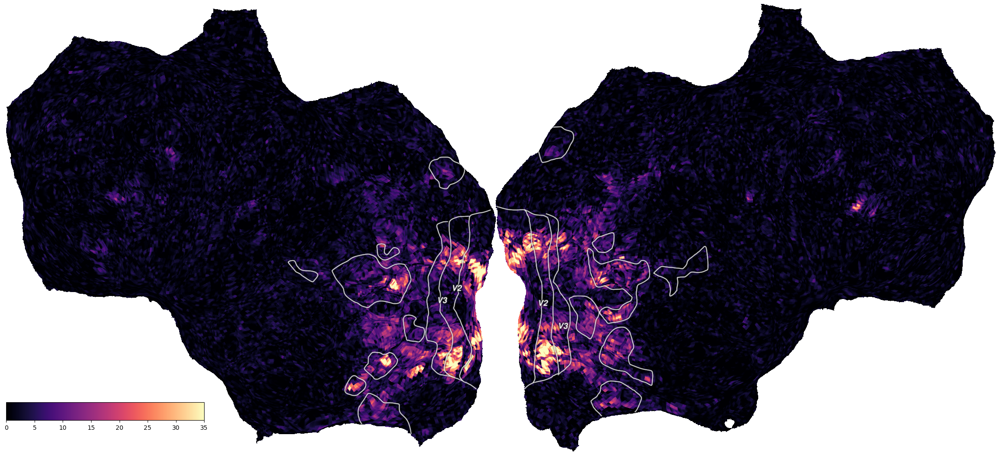

In [7]:
"""
Example: produce figure with color bar (to add to final composite figure)
"""

# set to True to export .png file
save_fig = False

nc_thresh = 0.0

s = "01"
    
ns = f"{ns_path}/sub-{s}/glmsingle/output/sub-{s}_task-things_space-T1w_model-fitHrfGLMdenoiseRR_stats-noiseCeilings_statmap.nii.gz"
ns_arr = np.swapaxes(nib.load(ns).get_fdata(), 0, -1)

ns_arr[ns_arr < nc_thresh] = np.nan
my_vol = cortex.Volume(
    ns_arr,
    f'sub-{s}',
    'align_auto',
    vmin=0,
    vmax=35,
    cmap='magma',
)
    
fig = plt.figure(figsize=(17*2,10*2))

cortex.quickshow(
    my_vol,
    pixelwise=True,
    colorbar_location='left',
    nanmean=True,
    with_curvature=True,
)
    
if save_fig:
    fig.savefig(f'{fig_save_path}/sub-{s}_noiseCeil_flatmap_cbar.png', dpi=600)
    

In [8]:
"""
Project noise ceiling on flatmap directly in Pycortex interactive GUI 


Note: this command line will open a separate window in your default web browser
"""

# set subject number: "01", "02", "03" or "06"
s = "01"

# Load noise ceilings
ns = f"{ns_path}/sub-{s}/glmsingle/output/sub-{s}_task-things_space-T1w_model-fitHrfGLMdenoiseRR_stats-noiseCeilings_statmap.nii.gz"
ns_arr = np.swapaxes(nib.load(ns).get_fdata(), 0, -1)

# Set threshold manually
# pick threshold, and replace below-threshold values by NaN
nc_thresh = 0.0
ns_arr[ns_arr < nc_thresh] = np.nan

# Project noise ceiling array (volume) to Pycortex surface
my_vol = cortex.Volume(ns_arr, f'sub-{s}', 'align_auto', vmin=0, vmax=35, cmap='terrain')
    
cortex.webshow(my_vol, recache=True)


Generating new ctm file...
wm
wm
inflated
inflated
Started server on port 10766


<JS: window.viewer>

Stopping server
